In [10]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import math, os, random, cv2
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from IPython.display import HTML
from torchgan.layers import VirtualBatchNorm,MinibatchDiscrimination1d

In [79]:
workers = 2

# Batch size during training
batch_size = 32

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 200

# Learning rate for optimizers
lr = 0.0006

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


In [80]:
root_path="train"

dataset = dset.ImageFolder(root=root_path,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers,drop_last=True)

device = torch.device("cuda:0")

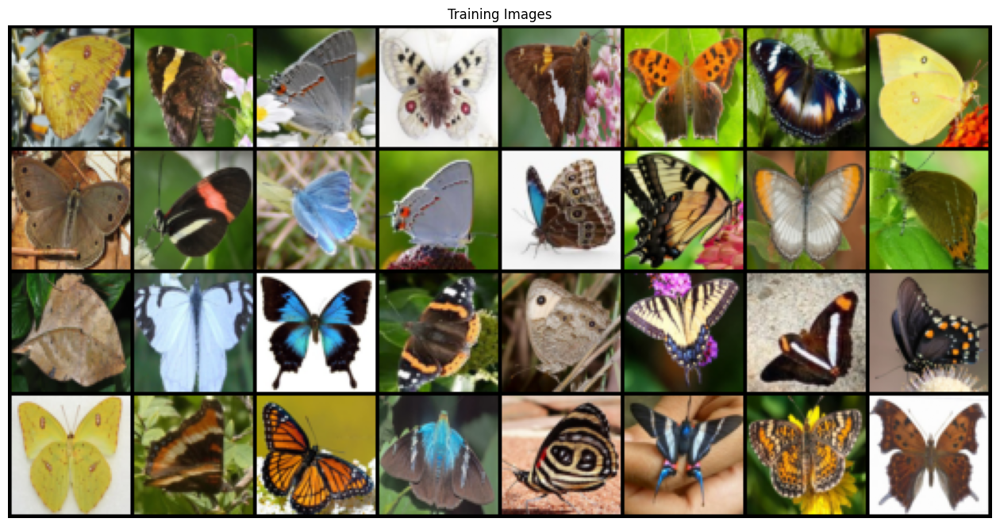

In [113]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [82]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [83]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [84]:
# Create the generator
netG = Generator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [85]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            #nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False)
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            # state size. (ndf*16) x 2 x 2
        )
        self.main2 = nn.Sequential(
            nn.Linear(4096+128,1),
            nn.Sigmoid()
        )
        self.minibatchdis=nn.Sequential(
            MinibatchDiscrimination1d(in_features =4096,out_features =128,intermediate_features =16),
        )
    def forward(self, input,matching = False):
        output = self.main(input)
        feature = output.view(-1,4096)
        #output = self.main2(feature)
        
        output = output.view(-1,4096)        
        output=self.minibatchdis(output)
        output=self.main2(output)
        
        if matching == True:
            return feature,output
        else:
            return output #batch_size x 1 x 1 x 1 => batch_size

In [86]:
netD = Discriminator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(1024, eps=1e-05

In [87]:
# Initialize BCELoss function
criterion = nn.BCELoss()
criterionG = nn.MSELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
#Using one-sided-label smoothing, we choose 0.85 as real_label
real_label = 0.85
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

schedulerD = optim.lr_scheduler.StepLR(optimizerD, step_size=int(num_epochs/4), gamma=0.5)
schedulerG = optim.lr_scheduler.StepLR(optimizerG, step_size=int(num_epochs/4), gamma=0.5)

In [89]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
D_G_z1s=[]
D_G_z2s=[]
D_xs=[]
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ## Train with all-real batch
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        
        # Calculate gradients for D in backward pass
        errD_real.backward()
        
        #Calculate the mean value of D(x) with x real images
        D_x = output.mean().item()

              
        ## Train with all-fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise) #generating the fake images
        label.fill_(fake_label) #replace the content of the previous label variable

        # Forward pass fake batch through D
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        
        # Calculate the gradients for this batch
        errD_fake.backward()
        
        #Calculate the mean value of D(G(z)) with G(z) generated image
        D_G_z1 = output.mean().item()
        
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()
        
       
        netG.zero_grad() #reset G gradient
        label.fill_(real_label)  # fake labels are real for generator cost
        
        ##Feature matching
        feature_real,_=netD(real_cpu,matching=True)
        feature_fake,output=netD(fake,matching=True)
        feature_real=torch.mean(feature_real,0)
        feature_fake=torch.mean(feature_fake,0)
        
        errG=criterionG(feature_fake,feature_real.detach())
        
        # Perform another forward pass of all-fake batch through D
        #output = netD(fake).view(-1)
        
        # Calculate G's loss based on this output
        errG += criterion(output.view(-1), label)
        
        # Calculate gradients for G
        errG.backward()
        
        #Calculate the mean value of D(G(z)) with G(z) generated image
        output = netD(fake).view(-1)        
        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        if i % 1 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        D_G_z1s.append(D_G_z1)
        D_G_z2s.append(D_G_z2)
        D_xs.append(D_x)      
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        
    schedulerG.step()
    schedulerD.step()

Starting Training Loop...
[0/200][0/290]	Loss_D: 0.8774	Loss_G: 2.6002	D(x): 0.4921	D(G(z)): 0.0640 / 0.0662
[0/200][1/290]	Loss_D: 0.7266	Loss_G: 2.9496	D(x): 0.8080	D(G(z)): 0.2181 / 0.0400
[0/200][2/290]	Loss_D: 0.9074	Loss_G: 2.9750	D(x): 0.6695	D(G(z)): 0.2779 / 0.0375
[0/200][3/290]	Loss_D: 0.6490	Loss_G: 3.3005	D(x): 0.8150	D(G(z)): 0.1703 / 0.0269
[0/200][4/290]	Loss_D: 0.6117	Loss_G: 3.0987	D(x): 0.6681	D(G(z)): 0.0695 / 0.0341
[0/200][5/290]	Loss_D: 1.3852	Loss_G: 2.6696	D(x): 0.4178	D(G(z)): 0.3876 / 0.0563
[0/200][6/290]	Loss_D: 2.3362	Loss_G: 4.2288	D(x): 0.4375	D(G(z)): 0.7204 / 0.0114
[0/200][7/290]	Loss_D: 1.0814	Loss_G: 3.9359	D(x): 0.4015	D(G(z)): 0.0342 / 0.0183
[0/200][8/290]	Loss_D: 0.6229	Loss_G: 2.9408	D(x): 0.6889	D(G(z)): 0.0589 / 0.0477
[0/200][9/290]	Loss_D: 0.7593	Loss_G: 2.5189	D(x): 0.7234	D(G(z)): 0.2006 / 0.0805
[0/200][10/290]	Loss_D: 1.1978	Loss_G: 4.0501	D(x): 0.7988	D(G(z)): 0.4561 / 0.0169
[0/200][11/290]	Loss_D: 1.2525	Loss_G: 3.1724	D(x): 0.3947	D

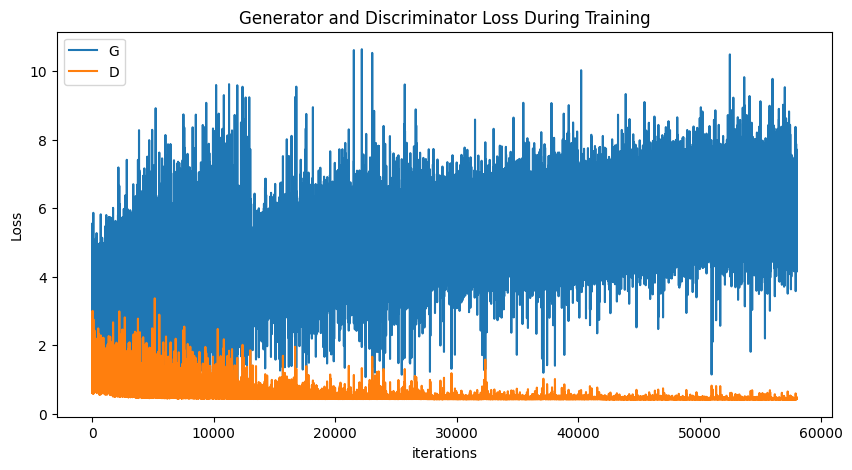

In [90]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

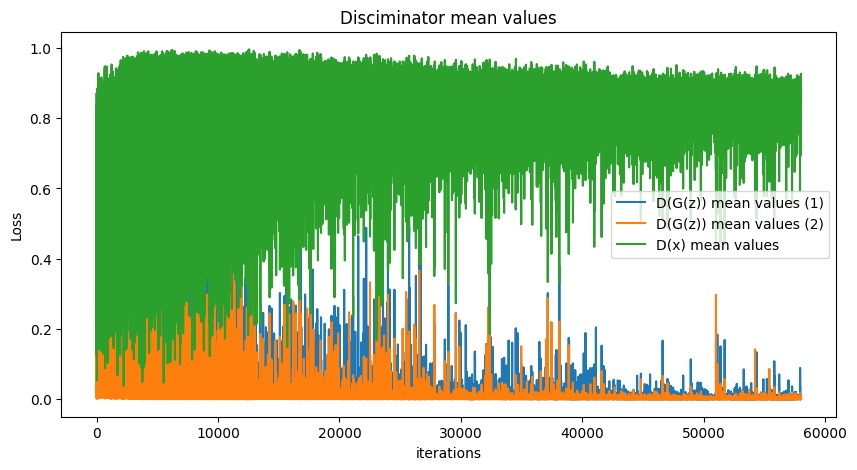

In [92]:
plt.figure(figsize=(10,5))
plt.title("Disciminator mean values")
plt.plot(D_G_z1s,label="D(G(z)) mean values (1)")
plt.plot(D_G_z2s,label="D(G(z)) mean values (2)")
plt.plot(D_xs,label="D(x) mean values")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

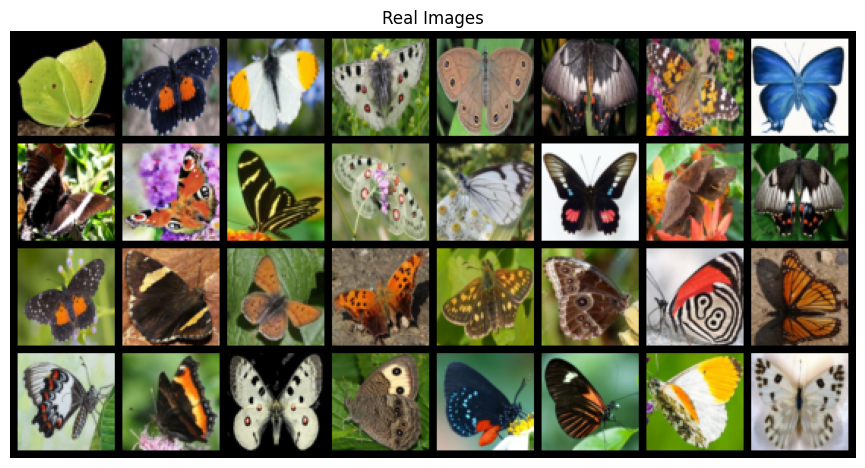

In [112]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(24,24))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

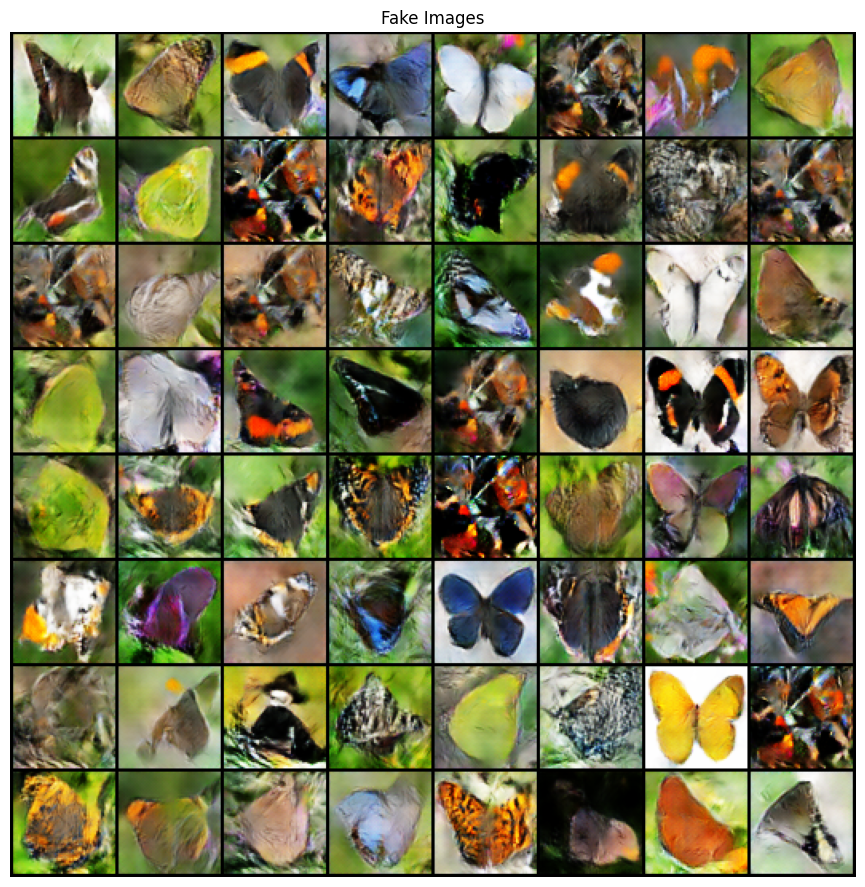

In [111]:
plt.figure(figsize=(24,24))
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()